In [1]:
import pandas as pd
import numpy as np
import seaborn as sns 
sns.set()
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
df=pd.read_excel("CSP_Defect monitoring 26Oct23.xlsx")

In [5]:
df.head()

,AutoUpdate,COIL_PRODUCED_DATETIME,CoilNo,SlabNo,GRADE,Thick,Width,Order,Product,Spec,...,NC,NCReason,REQUIREDACTION,ROLL_CHANGED,MoldNo,FixedCoolingType,LooseCoolingType,MILL_OPT,COILER_OPT,CoilNo2
0,-1,2022-12-30 13:00:56,1971525,787320009,1107DKGXC-01,1.453895,1231,15158-10,HB,SS400,...,NC,Telescopic Winding,No required further action (Enough Information),-,NaN,NaN,NaN,Narong Yodruk,Chayakorn Wisasa,1971525
1,-1,2022-12-30 13:06:43,1971526,787320010,1107DKGXC-01,1.454773,1231,15158-10,HB,SS400,...,NC,Zigzag Winding,No required further action (Enough Information),-,NaN,NaN,NaN,Narong Yodruk,Chayakorn Wisasa,1971526
2,-1,2022-12-30 13:12:25,1971527,787320011,1107DKGXC-01,1.453722,1231,15158-10,HB,SS400,...,NC,Zigzag Winding,No required further action (Enough Information),-,NaN,NaN,NaN,Narong Yodruk,Chayakorn Wisasa,1971527
3,-1,2022-12-30 13:18:07,1971528,787320012,1107DKGXC-01,1.454454,1230,15158-10,HB,SS400,...,NaN,NaN,NaN,-,NaN,NaN,NaN,Narong Yodruk,Chayakorn Wisasa,1971528
4,-1,2022-12-30 13:24:14,1971529,787330001,1107DKGXC-01,1.410000,1230,15155-20,HB,SS400,...,R,Fold Strip,No required further action (Enough Information),-,NaN,NaN,NaN,Narong Yodruk,Chayakorn Wisasa,1971529


<Axes: >

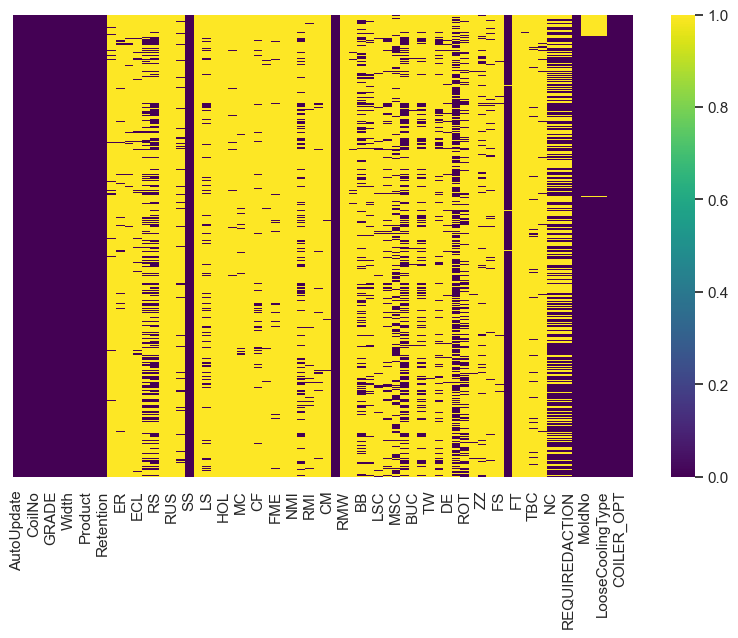

In [6]:
plt.figure(figsize=(10,6))
sns.heatmap(data=df.isnull(),cmap="viridis",yticklabels=False)

In [9]:
cols=["ECL","MC","TC","TE","ZZ"]
for i in cols:
    df[i] = df[i].replace('x', '', regex=True)

In [7]:
df=df[["COIL_PRODUCED_DATETIME","CoilNo","SlabNo","GRADE","Thick","Width","Order","Product","Spec","Retention",
       "ECL","MC","TC","TE","ZZ"]]

In [29]:
#df.loc[:,"TE":"BN":1] = df.loc[:,"TE":"BN":1].replace('x', '', regex=True)

In [16]:
df.head()

,COIL_PRODUCED_DATETIME,CoilNo,SlabNo,GRADE,Thick,Width,Order,Product,Spec,Retention,ECL,MC,TC,TE,ZZ
0,2022-12-30 13:00:56,1971525,787320009,1107DKGXC-01,1.453895,1231,15158-10,HB,SS400,17,0,0,0.0,4,3
1,2022-12-30 13:06:43,1971526,787320010,1107DKGXC-01,1.454773,1231,15158-10,HB,SS400,17,0,0,0.0,2,3
2,2022-12-30 13:12:25,1971527,787320011,1107DKGXC-01,1.453722,1231,15158-10,HB,SS400,18,0,0,0.0,2,4
3,2022-12-30 13:18:07,1971528,787320012,1107DKGXC-01,1.454454,1230,15158-10,HB,SS400,18,0,0,0.0,2,0
4,2022-12-30 13:24:14,1971529,787330001,1107DKGXC-01,1.410000,1230,15155-20,HB,SS400,18,0,0,0.0,4,4


In [15]:
for i in cols:
    df[i]=df[i].fillna(0)

In [92]:
import pandas as pd

# Assuming df is your DataFrame and 'ECL' is the column you're working with
df['ECL'] = pd.to_numeric(df['ECL'], errors='coerce').astype('Int64')

# Change <NA> to NaN
df['ECL'] = df['ECL'].mask(df['ECL'].isna(), pd.NA)


In [21]:
#df["ECL"].replace(pd.NA,np.nan,regex=True)
for i in cols:
    df[i]=df[i].astype("int")

In [22]:
df.dtypes

COIL_PRODUCED_DATETIME    datetime64[ns]
CoilNo                             int64
SlabNo                             int64
GRADE                             object
Thick                            float64
Width                              int64
Order                             object
Product                           object
Spec                              object
Retention                          int64
ECL                                int32
MC                                 int32
TC                                 int32
TE                                 int32
ZZ                                 int32
dtype: object

In [23]:
categorical_col=["GRADE","Order","Product","Spec"]
df[categorical_col] = df[categorical_col].astype('category')

In [24]:
from ydata_profiling import ProfileReport

In [25]:
profile=ProfileReport(df,title="Steel Manufacturing Report")

In [26]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [252]:
def diff(df, cols):
    for col in cols:
        time_diff= f'{col}_diff'
        time_diff = df[col] - df[col].shift(1)


In [44]:

df["timediff"]=df["COIL_PRODUCED_DATETIME"].copy()

#df=df2.copy()
#df.head()

In [45]:
diff(df,"timediff")

C:\Users\govin\AppData\Local\Temp\ipykernel_18720\3160298409.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[cols][i]=df[cols][i]-df[cols][i-1];


In [47]:
df.head()
    

,COIL_PRODUCED_DATETIME,CoilNo,SlabNo,GRADE,Thick,Width,Order,Product,Spec,Retention,ECL,MC,TC,TE,ZZ,timediff
0,2022-12-30 13:00:56,1971525,787320009,1107DKGXC-01,1.453895,1231,15158-10,HB,SS400,17,<NA>,<NA>,<NA>,4,3,2022-12-30 13:00:56
1,2022-12-30 13:06:43,1971526,787320010,1107DKGXC-01,1.454773,1231,15158-10,HB,SS400,17,<NA>,<NA>,<NA>,2,3,0 days 00:05:47
2,2022-12-30 13:12:25,1971527,787320011,1107DKGXC-01,1.453722,1231,15158-10,HB,SS400,18,<NA>,<NA>,<NA>,2,4,0 days 00:05:42
3,2022-12-30 13:18:07,1971528,787320012,1107DKGXC-01,1.454454,1230,15158-10,HB,SS400,18,<NA>,<NA>,<NA>,2,<NA>,0 days 00:05:42
4,2022-12-30 13:24:14,1971529,787330001,1107DKGXC-01,1.410000,1230,15155-20,HB,SS400,18,<NA>,<NA>,<NA>,4,4,0 days 00:06:07


In [435]:
#df['Hour'] = df['timediff'].dt.hour
df.dtypes

COIL_PRODUCED_DATETIME    datetime64[ns]
AutoUpdate                         int64
CoilNo                             int64
SlabNo                             int64
GRADE                           category
Thick                            float64
Width                              int64
Order                           category
Product                         category
Spec                            category
Retention                          int64
ECL                                Int64
MC                                 Int64
TC                               float64
TE                                 Int64
ZZ                                 Int64
timediff                          object
dtype: object

In [436]:
time_diff=df["timediff"].diff()

In [437]:
time_diff

0                     NaT
1         0 days 00:05:47
2       -1 days +23:59:55
3         0 days 00:00:00
4         0 days 00:00:25
               ...       
26009   -1 days +23:58:57
26010   -1 days +23:58:56
26011     0 days 00:03:09
26012   -1 days +23:56:37
26013   -1 days +23:58:03
Name: timediff, Length: 26014, dtype: timedelta64[ns]

In [440]:
count=0
for index,row in df.iterrows():
    if row["time_check"]:
        count=count+1
print(count)

297


In [441]:
count=0
for index,row in df.iterrows():
    if row["time_check"]:
        count=count+1
print(count)

297


In [442]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26014 entries, 0 to 26013
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   COIL_PRODUCED_DATETIME  26014 non-null  datetime64[ns]
 1   AutoUpdate              26014 non-null  int64         
 2   CoilNo                  26014 non-null  int64         
 3   SlabNo                  26014 non-null  int64         
 4   GRADE                   26014 non-null  category      
 5   Thick                   26014 non-null  float64       
 6   Width                   26014 non-null  int64         
 7   Order                   26014 non-null  category      
 8   Product                 25975 non-null  category      
 9   Spec                    26014 non-null  category      
 10  Retention               26014 non-null  int64         
 11  ECL                     1011 non-null   Int64         
 12  MC                      602 non-null    Int64 

In [ ]:
#new_row={"COIL_PRODUCED_DATETIME":pd.to_datetime('2022-01-01 14:00:00'),"CoilNo":1,"SlabNo":2,"GRADE":

In [443]:
original_categories = df['GRADE'].cat.categories

In [444]:
original_categories

Index(['1006DKGXA-00', '1019AKNXA-00', '1019AKNXA-T1', '1019DKGXA-02',
       '1019DKNXA-02', '1019RSIXA-00', '1107DKGXB-00', '1107DKGXC-01',
       '1107RSIXA-00', '1119DKGXA-00', '1120DKGXA-01', '1207DKGXA-00',
       '1207DKGXB-00', '1207DKNVA-01', '1207DKNVA-T3', '1207DKNXA-00',
       '1207DKNXA-T2', '1207DKNXB-T1', '1207RSIXA-T1', '1218DKGXA-T1',
       '1219RSIXA-T1', '1220DKGVB-01'],
      dtype='object')

In [445]:
nested_data = df.to_dict()
df_dict.keys()

dict_keys(['COIL_PRODUCED_DATETIME', 'CoilNo', 'SlabNo', 'GRADE', 'Thick', 'Width', 'Order', 'Product', 'Spec', 'Retention', 'ECL', 'MC', 'TC', 'TE', 'ZZ', 'timediff', 'time_check'])

In [340]:
"""""for index,row in df.iterrows():
    while row["time_check"]==False:
        current_df = pd.DataFrame(columns=['COIL_PRODUCED_DATETIME', 'CoilNo', 'SlabNo', 'GRADE',
                                       'Thick', 'Width', 'Order', 'Product', 
                                       'Spec', 'Retention', 'ECL', 'MC', 'TC', 'TE',
                                       'ZZ', 'timediff', 'time_check'])""""
        
    

SyntaxError: invalid syntax (4160804654.py, line 1)

In [343]:
''''df_nested = pd.DataFrame()
for index,row in df.iterrows():
    if row["time_check"]==False:
        df_nested = df_nested.append(pd.Series(row), ignore_index=True)
    else:
        df_nested = pd.DataFrame()
        df_nested = df_nested.append(pd.Series(row), ignore_index=True)'''

AttributeError: 'DataFrame' object has no attribute 'append'

In [395]:
df_nested.head(10)

""


In [446]:
len(group_indices)

295

In [447]:
group_indices[0]

(0, 98)

In [380]:
ProfileReport(df_nested,title="Steel Manufacturing Report",html={"style":{"full_width":True}})

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [449]:
df_dummy=df.copy()
df.head()

,COIL_PRODUCED_DATETIME,AutoUpdate,CoilNo,SlabNo,GRADE,Thick,Width,Order,Product,Spec,Retention,ECL,MC,TC,TE,ZZ,timediff,time_check
0,2022-12-30 13:00:56,-1,1971525,787320009,1107DKGXC-01,1.453895,1231,15158-10,HB,SS400,17,<NA>,<NA>,NaN,4,3,0 days 00:00:00,False
1,2022-12-30 13:06:43,-1,1971526,787320010,1107DKGXC-01,1.454773,1231,15158-10,HB,SS400,17,<NA>,<NA>,NaN,2,3,0 days 00:05:47,False
2,2022-12-30 13:12:25,-1,1971527,787320011,1107DKGXC-01,1.453722,1231,15158-10,HB,SS400,18,<NA>,<NA>,NaN,2,4,0 days 00:05:42,False
3,2022-12-30 13:18:07,-1,1971528,787320012,1107DKGXC-01,1.454454,1230,15158-10,HB,SS400,18,<NA>,<NA>,NaN,2,<NA>,0 days 00:05:42,False
4,2022-12-30 13:24:14,-1,1971529,787330001,1107DKGXC-01,1.410000,1230,15155-20,HB,SS400,18,<NA>,<NA>,NaN,4,4,0 days 00:06:07,False


In [453]:
df["Thick"][0]

7.586931948979592

In [470]:
l=[]
for i in group_indices:
    l.append(i[1]-i[0])


In [471]:
len(l)

295

In [472]:
print(l)

[98, 7, 7, 3, 40, 107, 17, 536, 3, 22, 112, 118, 118, 69, 4, 1, 33, 113, 307, 2, 3, 229, 16, 3, 33, 76, 22, 105, 115, 220, 310, 5, 33, 16, 123, 115, 58, 39, 157, 359, 118, 127, 67, 22, 111, 263, 150, 107, 41, 166, 4, 54, 120, 91, 122, 117, 147, 146, 190, 98, 113, 102, 1, 3, 153, 257, 295, 122, 130, 112, 138, 132, 87, 94, 136, 173, 1, 117, 81, 107, 123, 109, 143, 103, 53, 247, 122, 322, 67, 61, 92, 73, 15, 88, 9, 158, 198, 75, 105, 44, 202, 7, 95, 89, 67, 100, 3, 149, 52, 1, 6, 95, 106, 72, 1, 1, 121, 29, 37, 64, 87, 1, 26, 78, 25, 27, 82, 31, 187, 40, 106, 78, 2, 8, 95, 90, 226, 25, 205, 110, 92, 94, 93, 32, 1, 41, 2, 160, 157, 19, 37, 90, 16, 127, 4, 46, 90, 67, 54, 132, 261, 122, 102, 76, 117, 83, 107, 213, 112, 2, 24, 5, 68, 44, 22, 0, 1, 54, 10, 63, 137, 2, 111, 198, 66, 21, 99, 91, 83, 5, 133, 192, 130, 91, 104, 91, 103, 28, 22, 116, 122, 156, 54, 36, 35, 29, 41, 138, 269, 104, 99, 88, 3, 82, 21, 129, 60, 177, 3, 79, 3, 4, 37, 45, 91, 0, 2, 143, 61, 216, 69, 31, 98, 48, 3, 8, 1, 1

<Axes: >

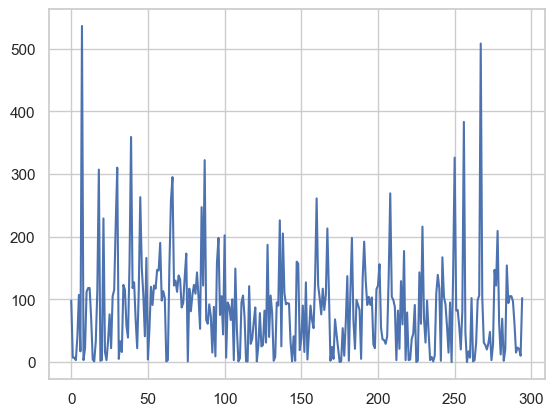

In [493]:

sns.lineplot(l)

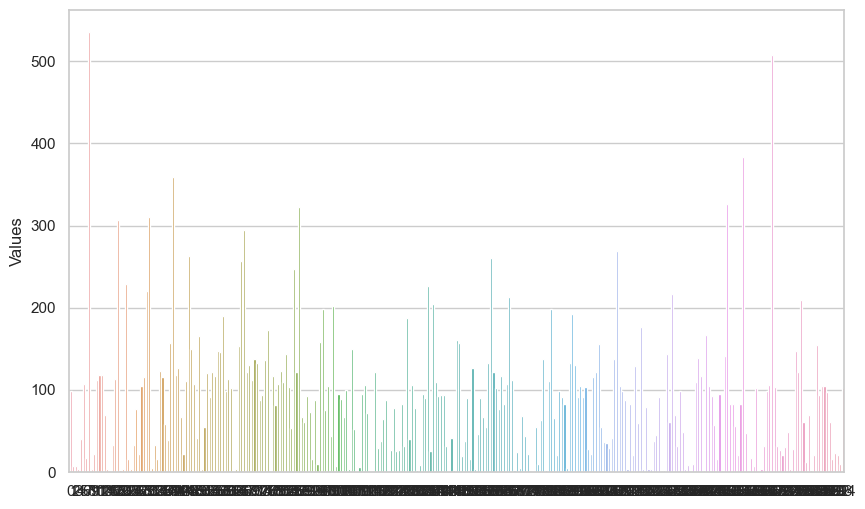

In [474]:
plot_df= pd.DataFrame({'Values': l})

sns.set(style="whitegrid")
plt.figure(figsize=(10,6))
sns.barplot(x=plot_df.index, y='Values', data=plot_df)
plt.show()

In [495]:
import plotly.express as px
fig = px.histogram(x=df["Thick"], title='Histogram',)
fig.show()

In [492]:
fig1 = px.histogram(x=l, nbins=50, title='Histogram',)
fig1.show()

In [491]:
df["Thick"].mean()

4.326681804143923

In [498]:
df_dummy=df.copy()

In [518]:
df['test'] = df["test"].apply(lambda x:x+=1 if x else x=1)

SyntaxError: expression cannot contain assignment, perhaps you meant "=="? (2058462532.py, line 1)

In [515]:
count=0
for index, row in df.iterrows():
    if row["time_check"]==False:
        count=count+1
        row["new_col"]=count
    else:
        count=1
        row["new_col"]=count
        

In [517]:
df.head()

,COIL_PRODUCED_DATETIME,AutoUpdate,CoilNo,SlabNo,GRADE,Thick,Width,Order,Product,Spec,Retention,ECL,MC,TC,TE,ZZ,timediff,time_check,new_col
0,2022-12-30 13:00:56,-1,1971525,787320009,1107DKGXC-01,1.453895,1231,15158-10,HB,SS400,17,<NA>,<NA>,NaN,4,3,0 days 00:00:00,False,52
1,2022-12-30 13:06:43,-1,1971526,787320010,1107DKGXC-01,1.454773,1231,15158-10,HB,SS400,17,<NA>,<NA>,NaN,2,3,0 days 00:05:47,False,52
2,2022-12-30 13:12:25,-1,1971527,787320011,1107DKGXC-01,1.453722,1231,15158-10,HB,SS400,18,<NA>,<NA>,NaN,2,4,0 days 00:05:42,False,52
3,2022-12-30 13:18:07,-1,1971528,787320012,1107DKGXC-01,1.454454,1230,15158-10,HB,SS400,18,<NA>,<NA>,NaN,2,<NA>,0 days 00:05:42,False,52
4,2022-12-30 13:24:14,-1,1971529,787330001,1107DKGXC-01,1.410000,1230,15155-20,HB,SS400,18,<NA>,<NA>,NaN,4,4,0 days 00:06:07,False,52


In [508]:
'''def new_col(df,cols):
    count=0
    for col in cols:
        if cols["time_check"]==False:
            count=count+1
        df["new_col"]=count
    else:
        count=0
        df["new_col"]=count'''

In [509]:
#new_col(df,"new_col")

TypeError: string indices must be integers, not 'str'

In [507]:
df.head()

,COIL_PRODUCED_DATETIME,AutoUpdate,CoilNo,SlabNo,GRADE,Thick,Width,Order,Product,Spec,Retention,ECL,MC,TC,TE,ZZ,timediff,time_check,new_col
0,2022-12-30 13:00:56,-1,1971525,787320009,1107DKGXC-01,1.453895,1231,15158-10,HB,SS400,17,<NA>,<NA>,NaN,4,3,0 days 00:00:00,False,52
1,2022-12-30 13:06:43,-1,1971526,787320010,1107DKGXC-01,1.454773,1231,15158-10,HB,SS400,17,<NA>,<NA>,NaN,2,3,0 days 00:05:47,False,52
2,2022-12-30 13:12:25,-1,1971527,787320011,1107DKGXC-01,1.453722,1231,15158-10,HB,SS400,18,<NA>,<NA>,NaN,2,4,0 days 00:05:42,False,52
3,2022-12-30 13:18:07,-1,1971528,787320012,1107DKGXC-01,1.454454,1230,15158-10,HB,SS400,18,<NA>,<NA>,NaN,2,<NA>,0 days 00:05:42,False,52
4,2022-12-30 13:24:14,-1,1971529,787330001,1107DKGXC-01,1.410000,1230,15155-20,HB,SS400,18,<NA>,<NA>,NaN,4,4,0 days 00:06:07,False,52


In [504]:
df["new_col"].iloc[200]

52

In [505]:
count=0
for index,row in df.iterrows():
    if row["time_check"]:
        count=count+1
print(count)

297


In [519]:
df['new_col'] = 0

count = 0

# Iterate through rows
for index, row in df.iterrows():
    if not row['time_check']:
        count += 1
    else:
        count = 1
    df.at[index, 'new_col'] = count

In [521]:
df.head(10)

,COIL_PRODUCED_DATETIME,AutoUpdate,CoilNo,SlabNo,GRADE,Thick,Width,Order,Product,Spec,Retention,ECL,MC,TC,TE,ZZ,timediff,time_check,new_col
0,2022-12-30 13:00:56,-1,1971525,787320009,1107DKGXC-01,1.453895,1231,15158-10,HB,SS400,17,<NA>,<NA>,NaN,4,3,0 days 00:00:00,False,1
1,2022-12-30 13:06:43,-1,1971526,787320010,1107DKGXC-01,1.454773,1231,15158-10,HB,SS400,17,<NA>,<NA>,NaN,2,3,0 days 00:05:47,False,2
2,2022-12-30 13:12:25,-1,1971527,787320011,1107DKGXC-01,1.453722,1231,15158-10,HB,SS400,18,<NA>,<NA>,NaN,2,4,0 days 00:05:42,False,3
3,2022-12-30 13:18:07,-1,1971528,787320012,1107DKGXC-01,1.454454,1230,15158-10,HB,SS400,18,<NA>,<NA>,NaN,2,<NA>,0 days 00:05:42,False,4
4,2022-12-30 13:24:14,-1,1971529,787330001,1107DKGXC-01,1.410000,1230,15155-20,HB,SS400,18,<NA>,<NA>,NaN,4,4,0 days 00:06:07,False,5
5,2022-12-30 13:32:33,-1,1971530,787330002,1107DKGXC-01,1.400113,1230,15155-20,HB,SS400,20,<NA>,<NA>,NaN,2,4,0 days 00:08:19,False,6
6,2022-12-30 13:41:51,-1,1971531,787330003,1107DKGXC-01,1.406769,1231,15155-20,HB,SS400,24,<NA>,<NA>,NaN,4,<NA>,0 days 00:09:18,False,7
7,2022-12-30 13:47:27,-1,1971532,787330004,1107DKGXC-01,1.407333,1230,15155-20,HB,SS400,24,<NA>,<NA>,NaN,<NA>,3,0 days 00:05:36,False,8
8,2022-12-30 13:52:51,-1,1971533,787330005,1107DKGXC-01,1.407925,1230,15155-20,HB,SS400,23,<NA>,<NA>,NaN,<NA>,<NA>,0 days 00:05:24,False,9
9,2022-12-30 13:57:48,-1,1971534,787330006,1107DKGXC-01,1.407295,1230,15155-20,HB,SS400,22,<NA>,<NA>,NaN,<NA>,<NA>,0 days 00:04:57,False,10


In [533]:
df_new=df[["Thick","new_col"]].describe()
df[["Thick","new_col"]].describe()

,Thick,new_col
count,26014.000000,26014.000000
mean,4.326682,80.517145
std,3.262678,78.779770
min,1.180000,1.000000
25%,1.903312,27.000000
50%,2.904359,60.000000
75%,5.800000,104.000000
max,20.010000,538.000000


In [523]:
df_new

,Thick,new_col
0,1.453895,1
1,1.454773,2
2,1.453722,3
3,1.454454,4
4,1.410000,5
...,...,...
26009,2.903162,49
26010,2.902766,50
26011,2.902605,51
26012,2.902925,52


In [529]:
import plotly.express as px
import pandas as pd
pd.DataFrame.iteritems = pd.DataFrame.items
fig = px.parallel_coordinates(df_new, color_continuous_midpoint=0,
                               dimensions=['Thick', 'new_col'],
                               labels={'Thick': 'Thickness', 'new_col': 'New Column'})
fig.show()

In [531]:
import plotly.express as px
pd.DataFrame.iteritems = pd.DataFrame.items
fig = px.parallel_coordinates(df, labels={'Thick': 'Thickness', 'new_col': 'New Column'},
                             color_continuous_scale=px.colors.diverging.Tealrose,
                             color_continuous_midpoint=2)
fig.show()

In [534]:
import plotly.express as px
pd.DataFrame.iteritems = pd.DataFrame.items
fig = px.parallel_coordinates(df_new, labels={'Thick': 'Thickness', 'new_col': 'New Column'},
                             color_continuous_scale=px.colors.diverging.Tealrose,
                             color_continuous_midpoint=2)
fig.show()

In [536]:
df.head()

,COIL_PRODUCED_DATETIME,AutoUpdate,CoilNo,SlabNo,GRADE,Thick,Width,Order,Product,Spec,Retention,ECL,MC,TC,TE,ZZ,timediff,time_check,new_col
0,2022-12-30 13:00:56,-1,1971525,787320009,1107DKGXC-01,1.453895,1231,15158-10,HB,SS400,17,<NA>,<NA>,NaN,4,3,0 days 00:00:00,False,1
1,2022-12-30 13:06:43,-1,1971526,787320010,1107DKGXC-01,1.454773,1231,15158-10,HB,SS400,17,<NA>,<NA>,NaN,2,3,0 days 00:05:47,False,2
2,2022-12-30 13:12:25,-1,1971527,787320011,1107DKGXC-01,1.453722,1231,15158-10,HB,SS400,18,<NA>,<NA>,NaN,2,4,0 days 00:05:42,False,3
3,2022-12-30 13:18:07,-1,1971528,787320012,1107DKGXC-01,1.454454,1230,15158-10,HB,SS400,18,<NA>,<NA>,NaN,2,<NA>,0 days 00:05:42,False,4
4,2022-12-30 13:24:14,-1,1971529,787330001,1107DKGXC-01,1.410000,1230,15155-20,HB,SS400,18,<NA>,<NA>,NaN,4,4,0 days 00:06:07,False,5


In [538]:
ProfileReport(df,title="Steel Manufacturing Report",html={"style":{"full_width":True}})

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df["Thick"].describe()

In [ ]:
sns.countplot(x="Thick", data=df[0:98])

In [ ]:
sns.barplot(data=df[0:98],x="Thick",y="Width")

In [33]:
df=pd.read_excel("F2.xlsx")

In [34]:
df.head()

,AutoUpdate,CoilNo,SlabNo,GRADE,Thick,Width,Order,Product,Spec,Retention,ECL,MC,TC,TE,ZZ
0,-1,1971525,787320009,1107DKGXC-01,1.453895,1231,15158-10,HB,SS400,17,NaN,NaN,NaN,4.0,3.0
1,-1,1971526,787320010,1107DKGXC-01,1.454773,1231,15158-10,HB,SS400,17,NaN,NaN,NaN,2.0,3.0
2,-1,1971527,787320011,1107DKGXC-01,1.453722,1231,15158-10,HB,SS400,18,NaN,NaN,NaN,2.0,4.0
3,-1,1971528,787320012,1107DKGXC-01,1.454454,1230,15158-10,HB,SS400,18,NaN,NaN,NaN,2.0,NaN
4,-1,1971529,787330001,1107DKGXC-01,1.410000,1230,15155-20,HB,SS400,18,NaN,NaN,NaN,4.0,4.0
